In [1]:
import os
import sys
import rasterio
from rasterio.plot import show
from rasterio.windows import Window
import re
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import box
from ultralytics import YOLO

In [2]:
main_folder_path = "/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/"
folders_to_delete = ["output"]  # Define folders to delete
for folder in folders_to_delete:
    folder_path = os.path.join(main_folder_path, folder)
    if os.path.exists(folder_path):  # Check if the folder exists
        shutil.rmtree(folder_path)
    else:
        pass  # Skip if the folder does not exist

# STEP 1
### File Check

In [3]:
# Define the folder path
main_folder_path = "/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/"
output_folder_path = "/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/"
tiles_folder_path = "/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/tiles"
labels_folder = "/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/labels"

# Check for required fiels
files = os.listdir(main_folder_path)

print("Files in folder:")
for file in files:
    print("-", file)

required_files = ["training_SAR_VV_base.tif", "bounding_boxes_ships.geojson"]
missing_files = [file for file in required_files if file not in files]

if missing_files: #if any of the required files are missing, let the user know which files are missing and interrupt the script
    print("Please upload:", missing_files)
    sys.exit()
else: print("Folder has all required files.")

Files in folder:
- bounding_boxes_ships.geojson
- yolov8n.pt
- training_SAR_VV_base.tif
- .ipynb_checkpoints
- SAR_ml_ship_detection.ipynb
Folder has all required files.


# STEP 2
### Data Prep

Found 111 bounding boxes in selected tile.


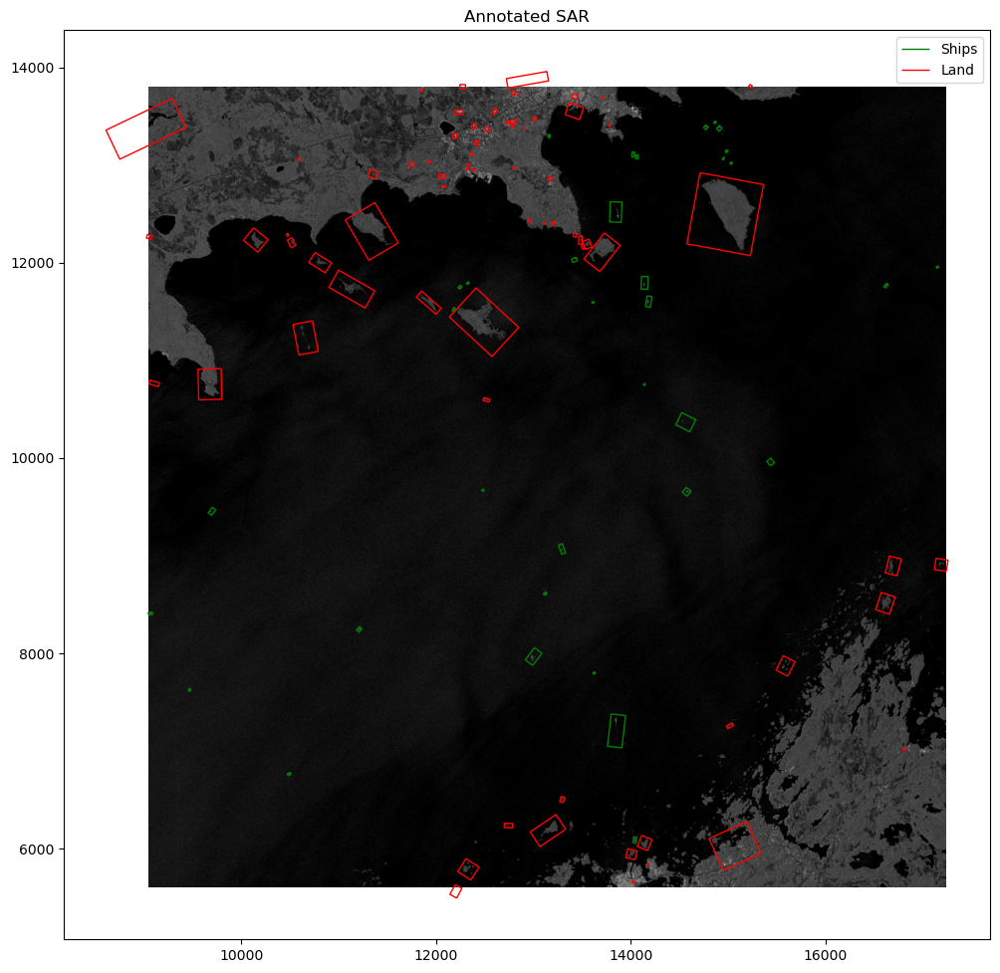

In [4]:
##### STEP 2 ####
### DATA PREP ###
#################

# Define file paths
sar_image_path = str(main_folder_path) + "training_SAR_VV_base.tif"
annotations_path = str(main_folder_path) + "bounding_boxes_ships.geojson"

# Load bounding boxes
gdf = gpd.read_file(annotations_path)

# Load SAR imagery
with rasterio.open(sar_image_path) as src:
    width, height = src.width, src.height
    tile_size = 8192

    # Select center point for visualization
    center_x, center_y = width // 2, height // 2
    half_tile = tile_size // 2
    window = ((center_y - half_tile, center_y + half_tile), (center_x - half_tile, center_x + half_tile))

    # Read in the SAR file and get tile transformation
    sar_tile = src.read(1, window=window)
    transform = src.window_transform(window)

    # Set bounding box in world coordinates
    tile_bounds = rasterio.windows.bounds(window, src.transform)
    tile_bbox = box(*tile_bounds)

# Verify that bounding boxes match the SAR's CRS
gdf = gdf.to_crs(src.crs)

# Filter bounding boxes inside selected tile
gdf_filtered = gdf[gdf.intersects(tile_bbox)]
print(f"Found {len(gdf_filtered)} bounding boxes in selected tile.")

# Split bounding boxes by class
ships = gdf_filtered[gdf_filtered["class"] == 1]
non_ships = gdf_filtered[gdf_filtered["class"] == 0]

# Plot the SAR tile
fig, ax = plt.subplots(figsize=(12, 12))
show(sar_tile, transform=transform, cmap="gray", vmin=35, vmax=75, ax=ax)

# Overlay bounding boxes with color-coded class annotations
if not ships.empty:
    ships.boundary.plot(ax=ax, edgecolor="green", linewidth=1, label="Ships")
if not non_ships.empty:
    non_ships.boundary.plot(ax=ax, edgecolor="red", linewidth=1, label="Land")

plt.legend()
plt.title("Annotated SAR")
plt.show()

# STEP 3
### Split SAR into readable tiles for ML model

Tile 0: Coordinates (0.0, 17777.0, 2190.0, 19393.0), Size: 2190x1616


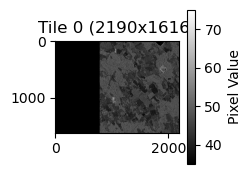

Tile 1: Coordinates (2190.0, 17777.0, 4380.0, 19393.0), Size: 2190x1616


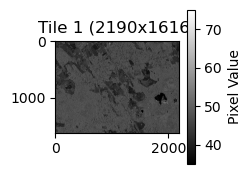

Tile 2: Coordinates (4380.0, 17777.0, 6570.0, 19393.0), Size: 2190x1616


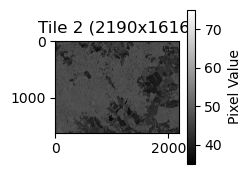

Tile 3: Coordinates (6570.0, 17777.0, 8760.0, 19393.0), Size: 2190x1616


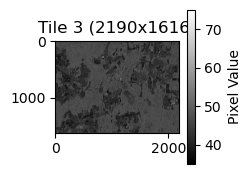

Tile 4: Coordinates (8760.0, 17777.0, 10950.0, 19393.0), Size: 2190x1616


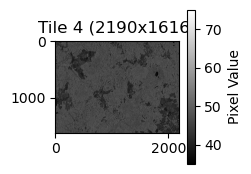

Tile 5: Coordinates (10950.0, 17777.0, 13140.0, 19393.0), Size: 2190x1616


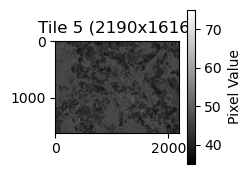

Tile 6: Coordinates (13140.0, 17777.0, 15330.0, 19393.0), Size: 2190x1616


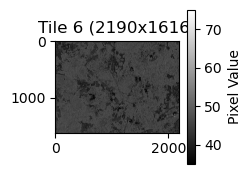

Tile 7: Coordinates (15330.0, 17777.0, 17520.0, 19393.0), Size: 2190x1616


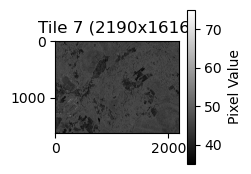

Tile 8: Coordinates (17520.0, 17777.0, 19710.0, 19393.0), Size: 2190x1616


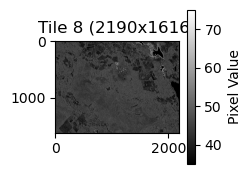

Tile 9: Coordinates (19710.0, 17777.0, 21900.0, 19393.0), Size: 2190x1616


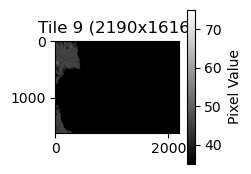

Tile 10: Coordinates (21900.0, 17777.0, 24090.0, 19393.0), Size: 2190x1616


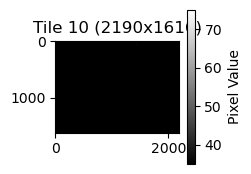

Tile 11: Coordinates (24090.0, 17777.0, 26280.0, 19393.0), Size: 2190x1616


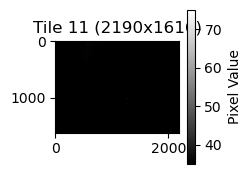

Tile 12: Coordinates (0.0, 16161.0, 2190.0, 17777.0), Size: 2190x1616


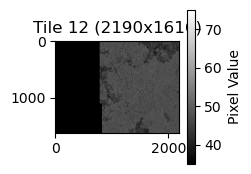

Tile 13: Coordinates (2190.0, 16161.0, 4380.0, 17777.0), Size: 2190x1616


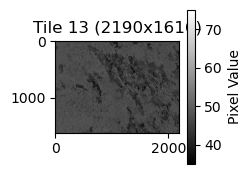

Tile 14: Coordinates (4380.0, 16161.0, 6570.0, 17777.0), Size: 2190x1616


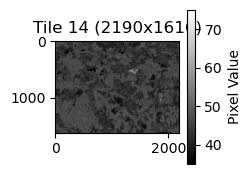

Tile 15: Coordinates (6570.0, 16161.0, 8760.0, 17777.0), Size: 2190x1616


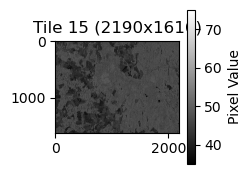

Tile 16: Coordinates (8760.0, 16161.0, 10950.0, 17777.0), Size: 2190x1616


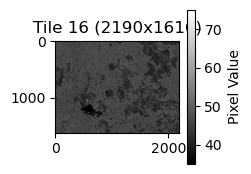

Tile 17: Coordinates (10950.0, 16161.0, 13140.0, 17777.0), Size: 2190x1616


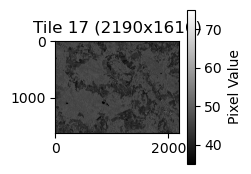

Tile 18: Coordinates (13140.0, 16161.0, 15330.0, 17777.0), Size: 2190x1616


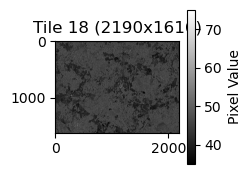

Tile 19: Coordinates (15330.0, 16161.0, 17520.0, 17777.0), Size: 2190x1616


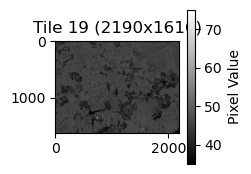

Tile 20: Coordinates (17520.0, 16161.0, 19710.0, 17777.0), Size: 2190x1616


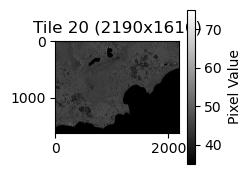

Tile 21: Coordinates (19710.0, 16161.0, 21900.0, 17777.0), Size: 2190x1616


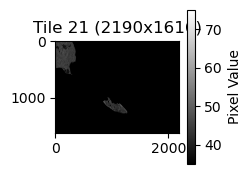

Tile 22: Coordinates (21900.0, 16161.0, 24090.0, 17777.0), Size: 2190x1616


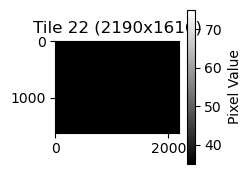

Tile 23: Coordinates (24090.0, 16161.0, 26280.0, 17777.0), Size: 2190x1616


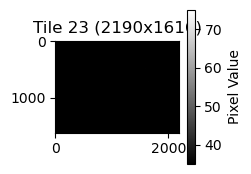

Tile 24: Coordinates (0.0, 14545.0, 2190.0, 16161.0), Size: 2190x1616


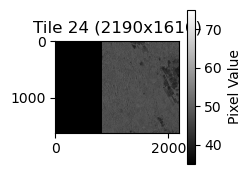

Tile 25: Coordinates (2190.0, 14545.0, 4380.0, 16161.0), Size: 2190x1616


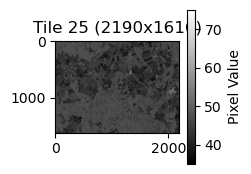

Tile 26: Coordinates (4380.0, 14545.0, 6570.0, 16161.0), Size: 2190x1616


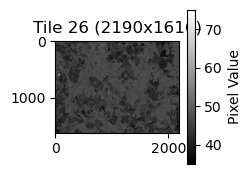

Tile 27: Coordinates (6570.0, 14545.0, 8760.0, 16161.0), Size: 2190x1616


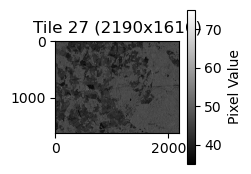

Tile 28: Coordinates (8760.0, 14545.0, 10950.0, 16161.0), Size: 2190x1616


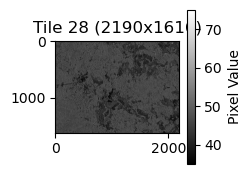

Tile 29: Coordinates (10950.0, 14545.0, 13140.0, 16161.0), Size: 2190x1616


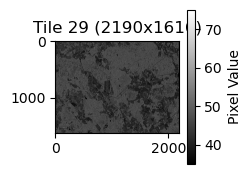

Tile 30: Coordinates (13140.0, 14545.0, 15330.0, 16161.0), Size: 2190x1616


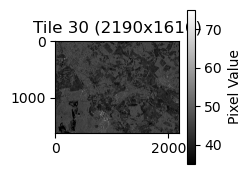

Tile 31: Coordinates (15330.0, 14545.0, 17520.0, 16161.0), Size: 2190x1616


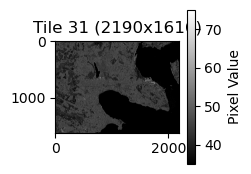

Tile 32: Coordinates (17520.0, 14545.0, 19710.0, 16161.0), Size: 2190x1616


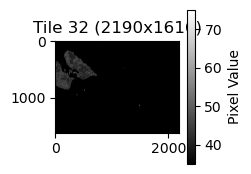

Tile 33: Coordinates (19710.0, 14545.0, 21900.0, 16161.0), Size: 2190x1616


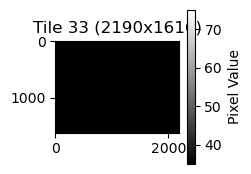

Tile 34: Coordinates (21900.0, 14545.0, 24090.0, 16161.0), Size: 2190x1616


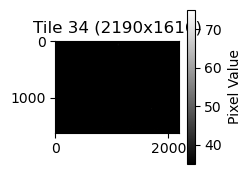

Tile 35: Coordinates (24090.0, 14545.0, 26280.0, 16161.0), Size: 2190x1616


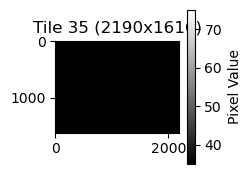

Tile 36: Coordinates (0.0, 12929.0, 2190.0, 14545.0), Size: 2190x1616


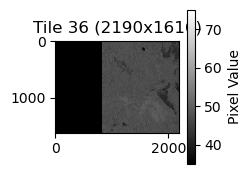

Tile 37: Coordinates (2190.0, 12929.0, 4380.0, 14545.0), Size: 2190x1616


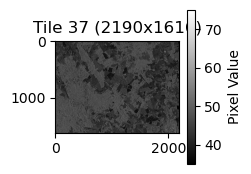

Tile 38: Coordinates (4380.0, 12929.0, 6570.0, 14545.0), Size: 2190x1616


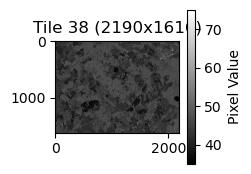

Tile 39: Coordinates (6570.0, 12929.0, 8760.0, 14545.0), Size: 2190x1616


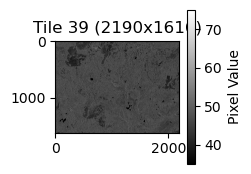

Tile 40: Coordinates (8760.0, 12929.0, 10950.0, 14545.0), Size: 2190x1616


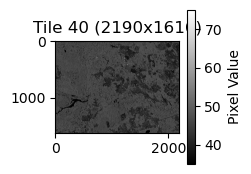

Tile 41: Coordinates (10950.0, 12929.0, 13140.0, 14545.0), Size: 2190x1616


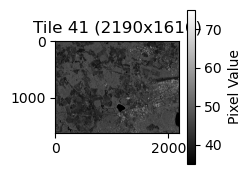

Tile 42: Coordinates (13140.0, 12929.0, 15330.0, 14545.0), Size: 2190x1616


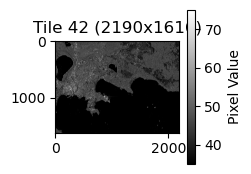

Tile 43: Coordinates (15330.0, 12929.0, 17520.0, 14545.0), Size: 2190x1616


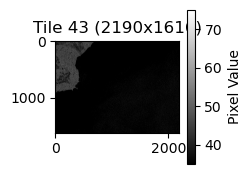

Tile 44: Coordinates (17520.0, 12929.0, 19710.0, 14545.0), Size: 2190x1616


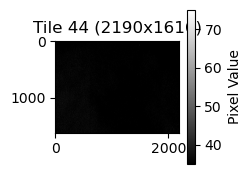

Tile 45: Coordinates (19710.0, 12929.0, 21900.0, 14545.0), Size: 2190x1616


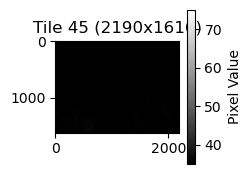

Tile 46: Coordinates (21900.0, 12929.0, 24090.0, 14545.0), Size: 2190x1616


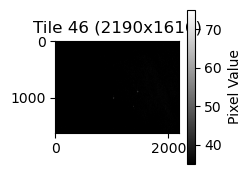

Tile 47: Coordinates (24090.0, 12929.0, 26280.0, 14545.0), Size: 2190x1616


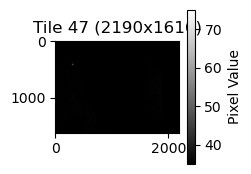

Tile 48: Coordinates (0.0, 11313.0, 2190.0, 12929.0), Size: 2190x1616


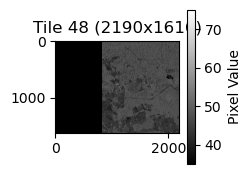

Tile 49: Coordinates (2190.0, 11313.0, 4380.0, 12929.0), Size: 2190x1616


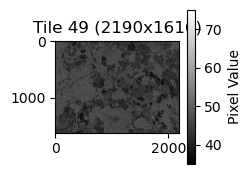

Tile 50: Coordinates (4380.0, 11313.0, 6570.0, 12929.0), Size: 2190x1616


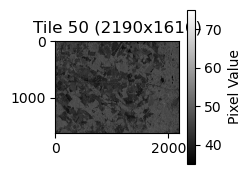

Tile 51: Coordinates (6570.0, 11313.0, 8760.0, 12929.0), Size: 2190x1616


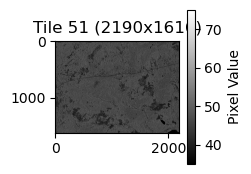

Tile 52: Coordinates (8760.0, 11313.0, 10950.0, 12929.0), Size: 2190x1616


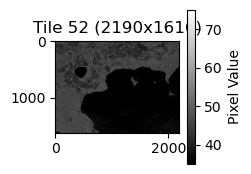

Tile 53: Coordinates (10950.0, 11313.0, 13140.0, 12929.0), Size: 2190x1616


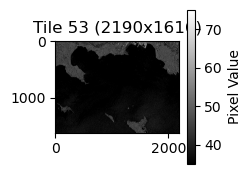

Tile 54: Coordinates (13140.0, 11313.0, 15330.0, 12929.0), Size: 2190x1616


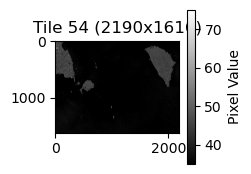

Tile 55: Coordinates (15330.0, 11313.0, 17520.0, 12929.0), Size: 2190x1616


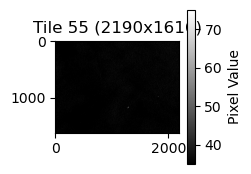

Tile 56: Coordinates (17520.0, 11313.0, 19710.0, 12929.0), Size: 2190x1616


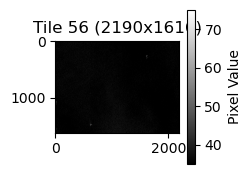

Tile 57: Coordinates (19710.0, 11313.0, 21900.0, 12929.0), Size: 2190x1616


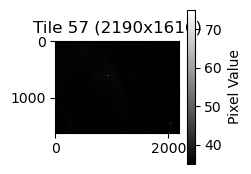

Tile 58: Coordinates (21900.0, 11313.0, 24090.0, 12929.0), Size: 2190x1616


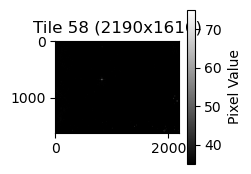

Tile 59: Coordinates (24090.0, 11313.0, 26280.0, 12929.0), Size: 2190x1616


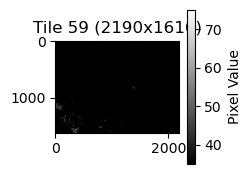

Tile 60: Coordinates (0.0, 9697.0, 2190.0, 11313.0), Size: 2190x1616


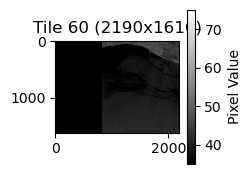

Tile 61: Coordinates (2190.0, 9697.0, 4380.0, 11313.0), Size: 2190x1616


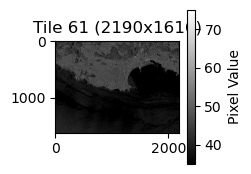

Tile 62: Coordinates (4380.0, 9697.0, 6570.0, 11313.0), Size: 2190x1616


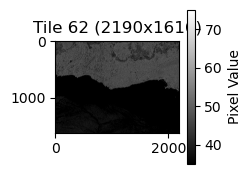

Tile 63: Coordinates (6570.0, 9697.0, 8760.0, 11313.0), Size: 2190x1616


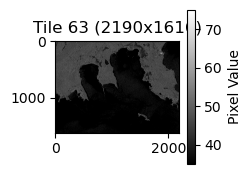

Tile 64: Coordinates (8760.0, 9697.0, 10950.0, 11313.0), Size: 2190x1616


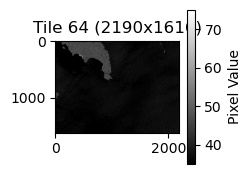

Tile 65: Coordinates (10950.0, 9697.0, 13140.0, 11313.0), Size: 2190x1616


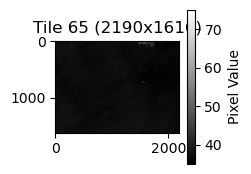

Tile 66: Coordinates (13140.0, 9697.0, 15330.0, 11313.0), Size: 2190x1616


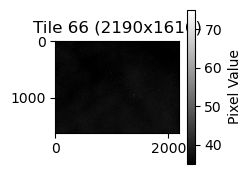

Tile 67: Coordinates (15330.0, 9697.0, 17520.0, 11313.0), Size: 2190x1616


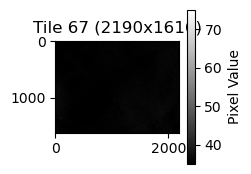

Tile 68: Coordinates (17520.0, 9697.0, 19710.0, 11313.0), Size: 2190x1616


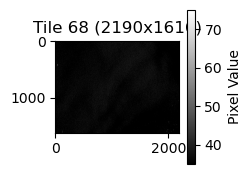

Tile 69: Coordinates (19710.0, 9697.0, 21900.0, 11313.0), Size: 2190x1616


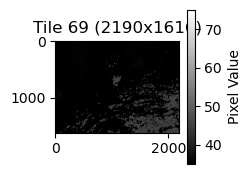

Tile 70: Coordinates (21900.0, 9697.0, 24090.0, 11313.0), Size: 2190x1616


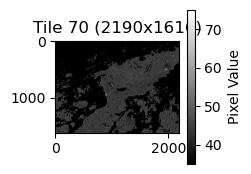

Tile 71: Coordinates (24090.0, 9697.0, 26280.0, 11313.0), Size: 2190x1616


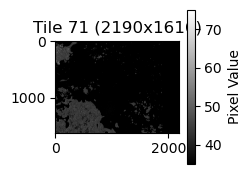

Tile 72: Coordinates (0.0, 8081.0, 2190.0, 9697.0), Size: 2190x1616


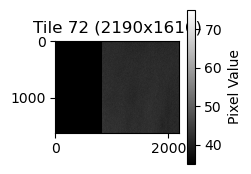

Tile 73: Coordinates (2190.0, 8081.0, 4380.0, 9697.0), Size: 2190x1616


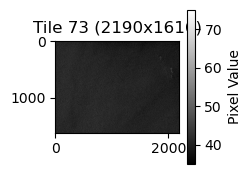

Tile 74: Coordinates (4380.0, 8081.0, 6570.0, 9697.0), Size: 2190x1616


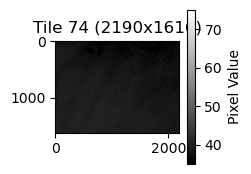

Tile 75: Coordinates (6570.0, 8081.0, 8760.0, 9697.0), Size: 2190x1616


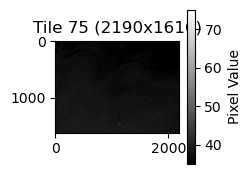

Tile 76: Coordinates (8760.0, 8081.0, 10950.0, 9697.0), Size: 2190x1616


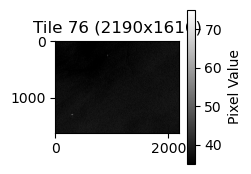

Tile 77: Coordinates (10950.0, 8081.0, 13140.0, 9697.0), Size: 2190x1616


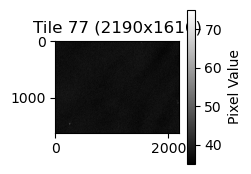

Tile 78: Coordinates (13140.0, 8081.0, 15330.0, 9697.0), Size: 2190x1616


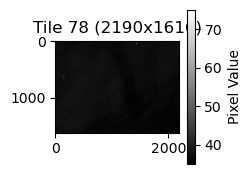

Tile 79: Coordinates (15330.0, 8081.0, 17520.0, 9697.0), Size: 2190x1616


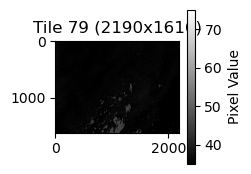

Tile 80: Coordinates (17520.0, 8081.0, 19710.0, 9697.0), Size: 2190x1616


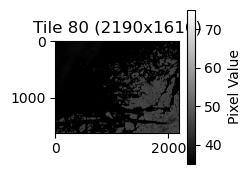

Tile 81: Coordinates (19710.0, 8081.0, 21900.0, 9697.0), Size: 2190x1616


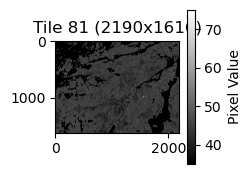

Tile 82: Coordinates (21900.0, 8081.0, 24090.0, 9697.0), Size: 2190x1616


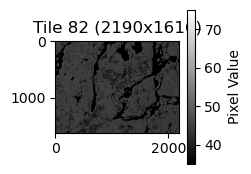

Tile 83: Coordinates (24090.0, 8081.0, 26280.0, 9697.0), Size: 2190x1616


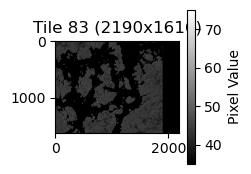

Tile 84: Coordinates (0.0, 6465.0, 2190.0, 8081.0), Size: 2190x1616


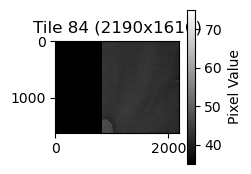

Tile 85: Coordinates (2190.0, 6465.0, 4380.0, 8081.0), Size: 2190x1616


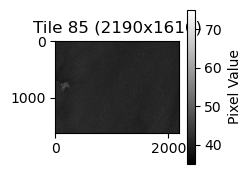

Tile 86: Coordinates (4380.0, 6465.0, 6570.0, 8081.0), Size: 2190x1616


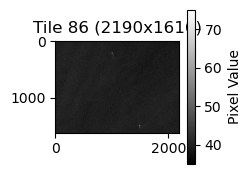

Tile 87: Coordinates (6570.0, 6465.0, 8760.0, 8081.0), Size: 2190x1616


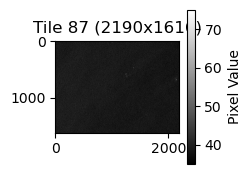

Tile 88: Coordinates (8760.0, 6465.0, 10950.0, 8081.0), Size: 2190x1616


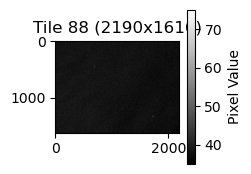

Tile 89: Coordinates (10950.0, 6465.0, 13140.0, 8081.0), Size: 2190x1616


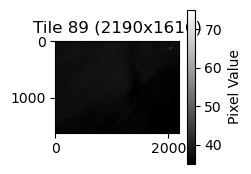

Tile 90: Coordinates (13140.0, 6465.0, 15330.0, 8081.0), Size: 2190x1616


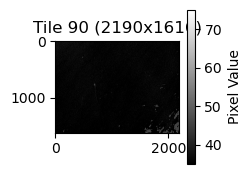

Tile 91: Coordinates (15330.0, 6465.0, 17520.0, 8081.0), Size: 2190x1616


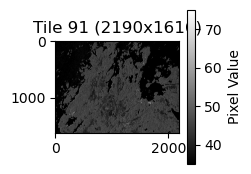

Tile 92: Coordinates (17520.0, 6465.0, 19710.0, 8081.0), Size: 2190x1616


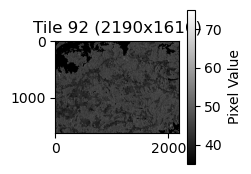

Tile 93: Coordinates (19710.0, 6465.0, 21900.0, 8081.0), Size: 2190x1616


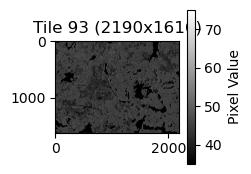

Tile 94: Coordinates (21900.0, 6465.0, 24090.0, 8081.0), Size: 2190x1616


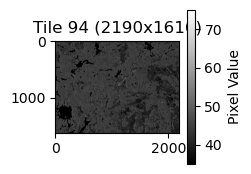

Tile 95: Coordinates (24090.0, 6465.0, 26280.0, 8081.0), Size: 2190x1616


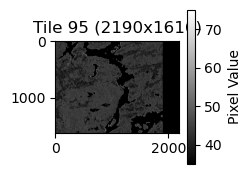

Tile 96: Coordinates (0.0, 4849.0, 2190.0, 6465.0), Size: 2190x1616


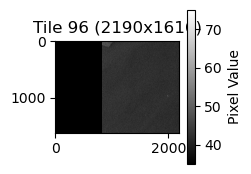

Tile 97: Coordinates (2190.0, 4849.0, 4380.0, 6465.0), Size: 2190x1616


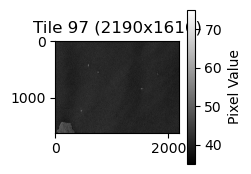

Tile 98: Coordinates (4380.0, 4849.0, 6570.0, 6465.0), Size: 2190x1616


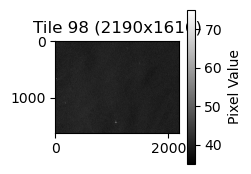

Tile 99: Coordinates (6570.0, 4849.0, 8760.0, 6465.0), Size: 2190x1616


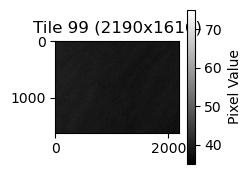

Tile 100: Coordinates (8760.0, 4849.0, 10950.0, 6465.0), Size: 2190x1616


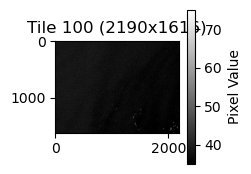

Tile 101: Coordinates (10950.0, 4849.0, 13140.0, 6465.0), Size: 2190x1616


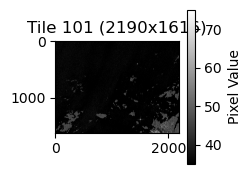

Tile 102: Coordinates (13140.0, 4849.0, 15330.0, 6465.0), Size: 2190x1616


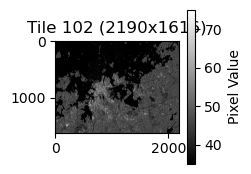

Tile 103: Coordinates (15330.0, 4849.0, 17520.0, 6465.0), Size: 2190x1616


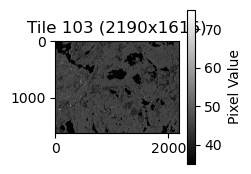

Tile 104: Coordinates (17520.0, 4849.0, 19710.0, 6465.0), Size: 2190x1616


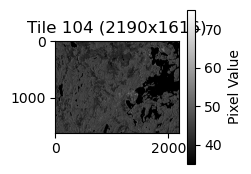

Tile 105: Coordinates (19710.0, 4849.0, 21900.0, 6465.0), Size: 2190x1616


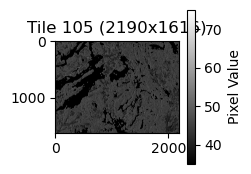

Tile 106: Coordinates (21900.0, 4849.0, 24090.0, 6465.0), Size: 2190x1616


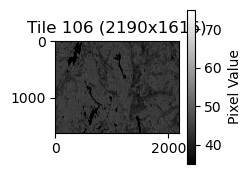

Tile 107: Coordinates (24090.0, 4849.0, 26280.0, 6465.0), Size: 2190x1616


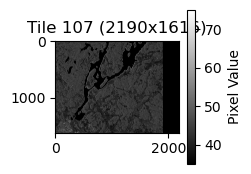

Tile 108: Coordinates (0.0, 3233.0, 2190.0, 4849.0), Size: 2190x1616


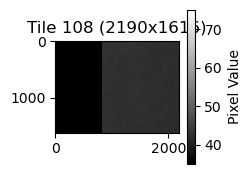

Tile 109: Coordinates (2190.0, 3233.0, 4380.0, 4849.0), Size: 2190x1616


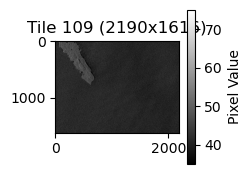

Tile 110: Coordinates (4380.0, 3233.0, 6570.0, 4849.0), Size: 2190x1616


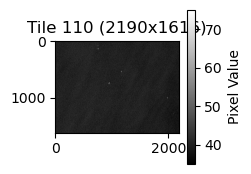

Tile 111: Coordinates (6570.0, 3233.0, 8760.0, 4849.0), Size: 2190x1616


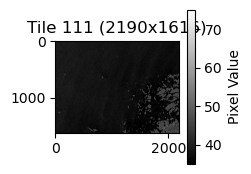

Tile 112: Coordinates (8760.0, 3233.0, 10950.0, 4849.0), Size: 2190x1616


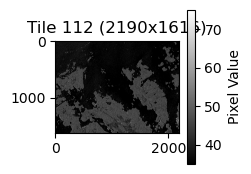

Tile 113: Coordinates (10950.0, 3233.0, 13140.0, 4849.0), Size: 2190x1616


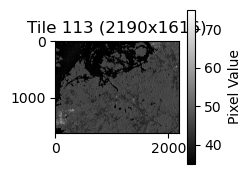

Tile 114: Coordinates (13140.0, 3233.0, 15330.0, 4849.0), Size: 2190x1616


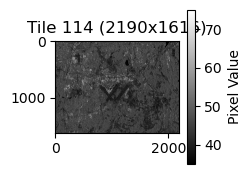

Tile 115: Coordinates (15330.0, 3233.0, 17520.0, 4849.0), Size: 2190x1616


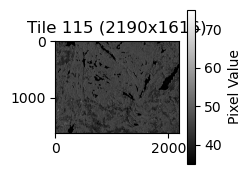

Tile 116: Coordinates (17520.0, 3233.0, 19710.0, 4849.0), Size: 2190x1616


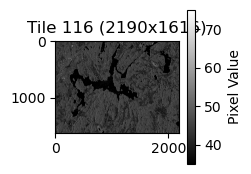

Tile 117: Coordinates (19710.0, 3233.0, 21900.0, 4849.0), Size: 2190x1616


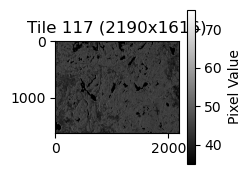

Tile 118: Coordinates (21900.0, 3233.0, 24090.0, 4849.0), Size: 2190x1616


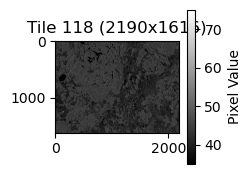

Tile 119: Coordinates (24090.0, 3233.0, 26280.0, 4849.0), Size: 2190x1616


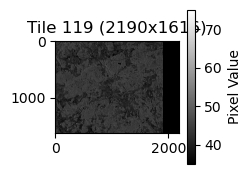

Tile 120: Coordinates (0.0, 1617.0, 2190.0, 3233.0), Size: 2190x1616


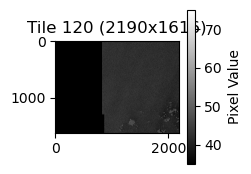

Tile 121: Coordinates (2190.0, 1617.0, 4380.0, 3233.0), Size: 2190x1616


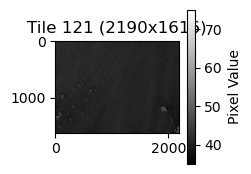

Tile 122: Coordinates (4380.0, 1617.0, 6570.0, 3233.0), Size: 2190x1616


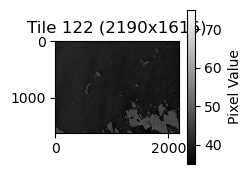

Tile 123: Coordinates (6570.0, 1617.0, 8760.0, 3233.0), Size: 2190x1616


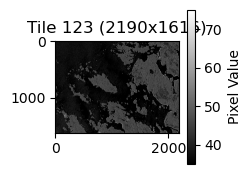

Tile 124: Coordinates (8760.0, 1617.0, 10950.0, 3233.0), Size: 2190x1616


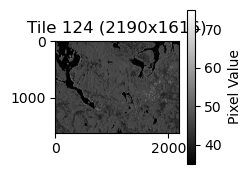

Tile 125: Coordinates (10950.0, 1617.0, 13140.0, 3233.0), Size: 2190x1616


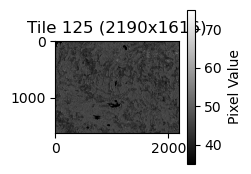

Tile 126: Coordinates (13140.0, 1617.0, 15330.0, 3233.0), Size: 2190x1616


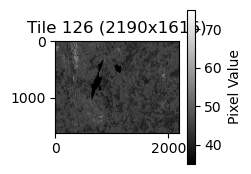

Tile 127: Coordinates (15330.0, 1617.0, 17520.0, 3233.0), Size: 2190x1616


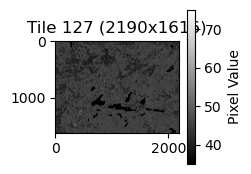

Tile 128: Coordinates (17520.0, 1617.0, 19710.0, 3233.0), Size: 2190x1616


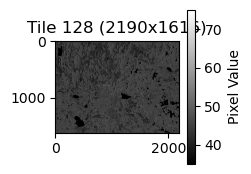

Tile 129: Coordinates (19710.0, 1617.0, 21900.0, 3233.0), Size: 2190x1616


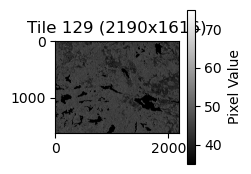

Tile 130: Coordinates (21900.0, 1617.0, 24090.0, 3233.0), Size: 2190x1616


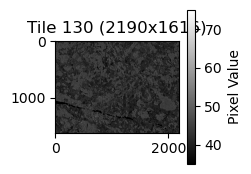

Tile 131: Coordinates (24090.0, 1617.0, 26280.0, 3233.0), Size: 2190x1616


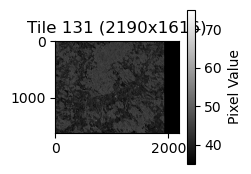

Tile 132: Coordinates (0.0, 1.0, 2190.0, 1617.0), Size: 2190x1616


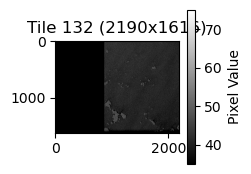

Tile 133: Coordinates (2190.0, 1.0, 4380.0, 1617.0), Size: 2190x1616


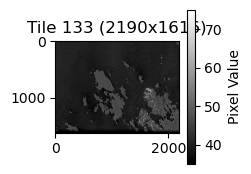

Tile 134: Coordinates (4380.0, 1.0, 6570.0, 1617.0), Size: 2190x1616


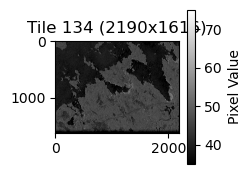

Tile 135: Coordinates (6570.0, 1.0, 8760.0, 1617.0), Size: 2190x1616


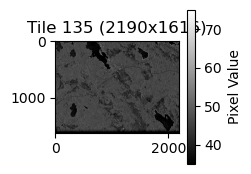

Tile 136: Coordinates (8760.0, 1.0, 10950.0, 1617.0), Size: 2190x1616


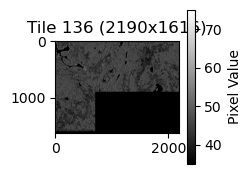

Tile 137: Coordinates (10950.0, 1.0, 13140.0, 1617.0), Size: 2190x1616


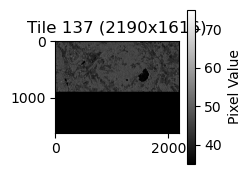

Tile 138: Coordinates (13140.0, 1.0, 15330.0, 1617.0), Size: 2190x1616


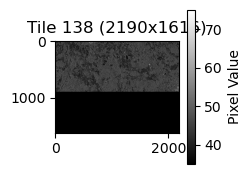

Tile 139: Coordinates (15330.0, 1.0, 17520.0, 1617.0), Size: 2190x1616


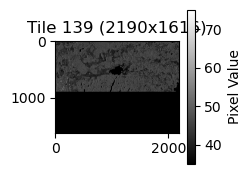

Tile 140: Coordinates (17520.0, 1.0, 19710.0, 1617.0), Size: 2190x1616


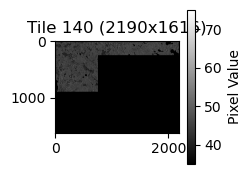

Tile 141: Coordinates (19710.0, 1.0, 21900.0, 1617.0), Size: 2190x1616


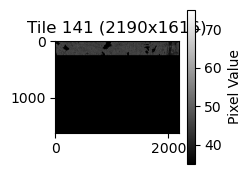

Tile 142: Coordinates (21900.0, 1.0, 24090.0, 1617.0), Size: 2190x1616


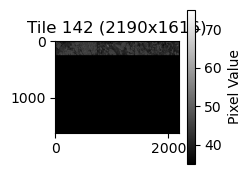

Tile 143: Coordinates (24090.0, 1.0, 26280.0, 1617.0), Size: 2190x1616


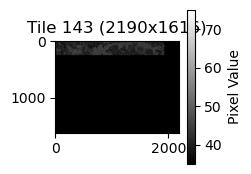

SAR split into 144 tiles which are saved in /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/tiles


In [5]:
# Create output folder if it doesn't exist
os.makedirs(output_folder_path, exist_ok=True)
# Create tiles folder if it doesn't exist
os.makedirs(tiles_folder_path, exist_ok=True)

# Open SAR image
with rasterio.open(sar_image_path) as src:
    width, height = src.width, src.height

    # Compute equal-sized tiles based on a square grid
    num_tiles_x = int(np.sqrt(144))  # Make judgement call and adjust based how many ship observations are seen in each tile
    num_tiles_y = num_tiles_x  # Need squares for YOLO ML model
    tile_width = width // num_tiles_x
    tile_height = height // num_tiles_y
    tile_idx = 0

    # Loop through and extract equal tiles
    for i in range(num_tiles_y):  
        for j in range(num_tiles_x):  
            x = j * tile_width
            y = i * tile_height
            # Define tile window
            window = Window(x, y, tile_width, tile_height)
            tile_data = src.read(1, window=window)
            # Define output filename
            tiles_filename = os.path.join(tiles_folder_path, f"tile_{tile_idx:03d}.tif")
            # Save tile
            out_meta = src.meta.copy()
            out_meta.update({
                "driver": "GTiff",
                "height": tile_height,
                "width": tile_width,
                "transform": rasterio.windows.transform(window, src.transform)
            })

            with rasterio.open(tiles_filename, "w", **out_meta) as dest:
                dest.write(tile_data, 1)

            # Print tile details
            tile_bounds = rasterio.windows.bounds(window, src.transform)
            print(f"Tile {tile_idx}: Coordinates {tile_bounds}, Size: {tile_width}x{tile_height}")

            # Show the tile
            plt.figure(figsize=(2, 2))
            plt.title(f"Tile {tile_idx} ({tile_width}x{tile_height})")
            plt.imshow(tile_data, cmap="gray", vmin=35, vmax=75)
            plt.colorbar(label="Pixel Value")
            plt.show()

            tile_idx += 1

print(f"SAR split into {tile_idx} tiles which are saved in {tiles_folder_path}")

# STEP 4
### Convert bounding boxes for input into ML model

In [6]:
# Create labels folder if it doesn't exist
os.makedirs(labels_folder, exist_ok=True)

# Load bounding boxes
gdf = gpd.read_file(annotations_path)

# Open the SAR image
with rasterio.open(sar_image_path) as src:
    # Ensure bounding boxes match SAR image CRS
    if gdf.crs != src.crs:
        print(f" CRS mismatch! Converting annotations from {gdf.crs} to {src.crs}")
        gdf = gdf.to_crs(src.crs)

# Sorting function to handle `tile_XXX.tif` correctly
def extract_tile_number(filename):
    match = re.search(r"tile_(\d+)", filename)
    return int(match.group(1)) if match else float("inf")

# Get sorted tile filenames
tile_files = sorted([f for f in os.listdir(tiles_folder_path) if f.endswith(".tif")], key=extract_tile_number)

expected_labels = len(tile_files)

# Iterate through sorted tiles and match bounding boxes
for tile_file in tile_files:
    tile_path = os.path.join(tiles_folder_path, tile_file)

    with rasterio.open(tile_path) as src:
        tile_transform = src.transform
        tile_width, tile_height = src.width, src.height

        # Get tile bounding box (world coordinates)
        minx, miny, maxx, maxy = rasterio.windows.bounds(
            rasterio.windows.Window(0, 0, tile_width, tile_height), tile_transform
        )
        tile_bbox = box(minx, miny, maxx, maxy)

        # Filter annotations that fall inside this tile
        gdf_tile = gdf[gdf.intersects(tile_bbox)].copy()

        # Debug prints
        print(f"Processing: {tile_file}")
        print(f"Tile Bounding Box: {tile_bbox.bounds}")
        print(f"Found {len(gdf_tile)} bounding boxes for this tile")

        # Define label filename
        label_filename = os.path.join(labels_folder, tile_file.replace(".tif", ".txt"))

        ### 🔹 **NEW: Create Empty Label File for Tiles with No Bounding Boxes**
        if gdf_tile.empty:
            print(f"No bounding boxes in {tile_file}. Creating an empty label file.")
            with open(label_filename, "w") as label_file:
                label_file.write("")  # Creates an empty file for YOLO compatibility
            continue  # Move to the next tile

        # Save bounding boxes in YOLO format
        with open(label_filename, "w") as label_file:
            for _, row in gdf_tile.iterrows():
                # Get bounding box in world coordinates
                obj_minx, obj_miny, obj_maxx, obj_maxy = row.geometry.bounds

                # Convert to tile pixel coordinates
                obj_minx, obj_miny = ~tile_transform * (obj_minx, obj_miny)
                obj_maxx, obj_maxy = ~tile_transform * (obj_maxx, obj_maxy)

                # Ensure min/max values are correctly ordered
                obj_minx, obj_maxx = min(obj_minx, obj_maxx), max(obj_minx, obj_maxx)
                obj_miny, obj_maxy = min(obj_miny, obj_maxy), max(obj_miny, obj_maxy)

                # Compute YOLO format values (normalized)
                x_center = ((obj_minx + obj_maxx) / 2) / tile_width
                y_center = ((obj_miny + obj_maxy) / 2) / tile_height
                width = (obj_maxx - obj_minx) / tile_width
                height = (obj_maxy - obj_miny) / tile_height

                # Fix height issue (ensure no zero values)
                if height == 0 or width == 0:
                    continue  # Skip invalid bounding boxes

                # Ensure values are within (0,1) range
                x_center, y_center, width, height = map(lambda v: max(0, min(1, v)), [x_center, y_center, width, height])

                # Get class label (0 = non-ship, 1 = ship)
                class_id = int(row["class"])

                # Write YOLO label
                label_file.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

        print(f"Labels saved: {label_filename}")

# Count and verify saved labels
saved_labels = len([f for f in os.listdir(labels_folder) if f.endswith(".txt")])

print(f"Expected Labels: {expected_labels}, Saved Labels: {saved_labels}")


🟢 Processing: tile_000.tif
🟡 Tile Bounding Box: (0.0, 17777.0, 2190.0, 19393.0)
🔴 Found 3 bounding boxes for this tile
✅ Labels saved: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/labels/tile_000.txt
🟢 Processing: tile_001.tif
🟡 Tile Bounding Box: (2190.0, 17777.0, 4380.0, 19393.0)
🔴 Found 1 bounding boxes for this tile
✅ Labels saved: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/labels/tile_001.txt
🟢 Processing: tile_002.tif
🟡 Tile Bounding Box: (4380.0, 17777.0, 6570.0, 19393.0)
🔴 Found 0 bounding boxes for this tile
⚠️ No bounding boxes in tile_002.tif. Creating an empty label file.
🟢 Processing: tile_003.tif
🟡 Tile Bounding Box: (6570.0, 17777.0, 8760.0, 19393.0)
🔴 Found 2 bounding boxes for this tile
✅ Labels saved: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/labels/tile_003.txt
🟢 Processing: tile_004.tif
🟡 Tile Bounding Box: (8760.0, 17777.0, 10950.0, 19393.0)
🔴 Found 0 bo

# STEP 5
### Split data into training and validation sets

In [7]:
# Paths
images_folder = os.path.join(output_folder_path, "tiles")
labels_folder = os.path.join(output_folder_path, "labels")
train_images_folder = os.path.join(output_folder_path, "train/images")
val_images_folder = os.path.join(output_folder_path, "val/images")
train_labels_folder = os.path.join(output_folder_path, "train/labels")
val_labels_folder = os.path.join(output_folder_path, "val/labels")

# Create train/val directories if they don't exist
for folder in [train_images_folder, val_images_folder, train_labels_folder, val_labels_folder]:
    os.makedirs(folder, exist_ok=True)

# Get list of image files
image_files = sorted([f for f in os.listdir(images_folder) if f.endswith(".tif")])

# Shuffle and split (80% train, 20% validation)
random.seed(42)  # Ensures reproducibility
random.shuffle(image_files)
split_index = int(0.8 * len(image_files))
train_files = image_files[:split_index]
val_files = image_files[split_index:]

# Function to move files
def move_files(file_list, src_folder, dest_folder, ext):
    for file in file_list:
        src_path = os.path.join(src_folder, file)
        dest_path = os.path.join(dest_folder, file)
        shutil.copy2(src_path, dest_path)  # Copy file to train/val folder
        #print(f"Moved {file} to {dest_folder}")

# Move images
move_files(train_files, images_folder, train_images_folder, ".tif")
move_files(val_files, images_folder, val_images_folder, ".tif")

# Move corresponding label files
train_labels = [f.replace(".tif", ".txt") for f in train_files]
val_labels = [f.replace(".tif", ".txt") for f in val_files]
move_files(train_labels, labels_folder, train_labels_folder, ".txt")
move_files(val_labels, labels_folder, val_labels_folder, ".txt")

print(f"Dataset split complete! {len(train_files)} train, {len(val_files)} validation.")


✅ Dataset split complete! 115 train, 29 validation.


# STEP 6
### Random validation set

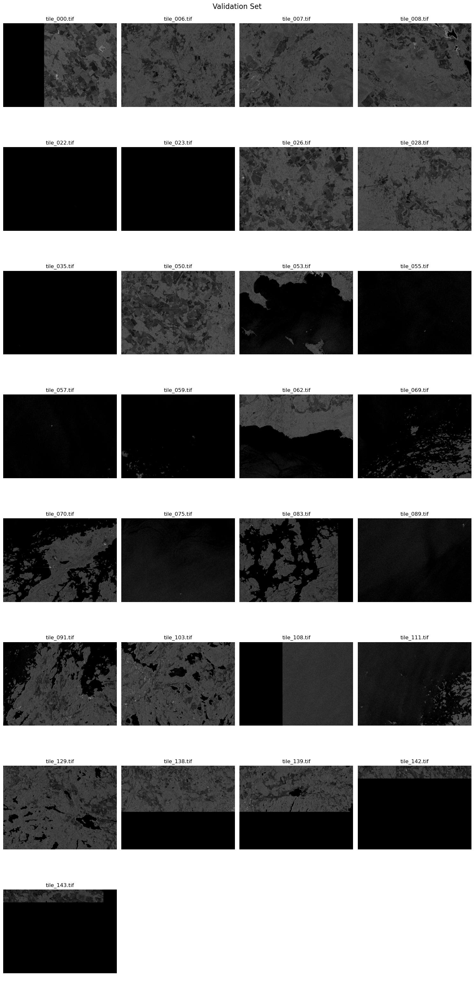

In [8]:
# Get all validation tile filenames
val_tiles = sorted([f for f in os.listdir(val_images_folder) if f.endswith(".tif")])

# Determine grid size (auto-adjust)
num_tiles = len(val_tiles)
cols = 4  # Set 4 columns
rows = (num_tiles // cols) + (num_tiles % cols > 0)  # Auto-calculate rows

# Create figure for visualization
fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))
axes = axes.flatten()

for idx, tile_file in enumerate(val_tiles):
    tile_path = os.path.join(val_images_folder, tile_file)

    with rasterio.open(tile_path) as src:
        sar_tile = src.read(1).astype(np.float32)

        # Normalize grayscale values for better contrast
        sar_tile = np.clip(sar_tile, 35, 75)  # Keep in SAR range
        sar_tile = (sar_tile - 35) / (75 - 35)  # Normalize to (0,1)

        axes[idx].imshow(sar_tile, cmap="gray", vmin=0, vmax=1)
        axes[idx].set_title(tile_file)
        axes[idx].axis("off")

# Hide any unused subplot axes
for idx in range(num_tiles, len(axes)):
    axes[idx].axis("off")

plt.suptitle("Validation Set", fontsize=16)
plt.tight_layout()
plt.show()


# STEP 7
### Selected validation set

In [9]:
# Tiles to remove from validation (back to training)
add_to_val = ["tile_001.tif"]
remove_from_val = ["tile_000.tif"]

# Function to move files (only if they exist)
def move_files(file_list, src_folder, dest_folder):
    for file in file_list:
        src_path = os.path.join(src_folder, file)
        dest_path = os.path.join(dest_folder, file)
        if os.path.exists(src_path):
            shutil.move(src_path, dest_path)
            print(f"Moved {file} to {dest_folder}")
        else:
            print(f"File not found: {src_path}")

# Move images back to training
move_files(remove_from_val, val_images_folder, train_images_folder)

# Move labels back to training
move_files([f.replace(".tif", ".txt") for f in remove_from_val], val_labels_folder, train_labels_folder)

# Move selected tiles to validation
move_files(add_to_val, train_images_folder, val_images_folder)

# Move corresponding labels to validation
move_files([f.replace(".tif", ".txt") for f in add_to_val], train_labels_folder, val_labels_folder)

print(f"Tile swap complete! Validation set updated.")


# Manually check if the removed validation tiles are now in train/images
removed_from_val = remove_from_val

train_images_folder = str(output_folder_path) + "train/images"

missing_tiles = [tile for tile in removed_from_val if tile not in os.listdir(train_images_folder)]

if missing_tiles:
    print(f"The following tiles were NOT found in train/images: {missing_tiles}")
else:
    print("All removed validation tiles successfully moved to train/images.")


✅ Moved tile_000.tif to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images
✅ Moved tile_000.txt to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/labels
✅ Moved tile_001.tif to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/val/images
✅ Moved tile_001.txt to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/val/labels
✅ Tile swap complete! Validation set updated.
✅ All removed validation tiles successfully moved to train/images.


# STEP 8 
### Convert to 8-bit images

In [10]:
# Set folders
folders_to_fix = ["train/images", "val/images"]

# Function to convert 32-bit TIFFs to 8-bit
def convert_to_8bit(image_path):
    with rasterio.open(image_path) as src:
        img = src.read(1).astype(np.float32)  # Read as float32
        profile = src.profile  # Copy metadata

        # Normalize SAR grayscale values (35-75) to 0-255 (8-bit)
        img = np.clip(img, 35, 75)  # Clip to SAR range
        img = ((img - 35) / (75 - 35) * 255).astype(np.uint8)  # Normalize to 0-255

        # Update metadata for 8-bit output
        profile.update(dtype=rasterio.uint8, nodata=0)

        # Overwrite original file with 8-bit version
        with rasterio.open(image_path, "w", **profile) as dst:
            dst.write(img, 1)

        print(f"Converted to 8-bit: {image_path}")

# Process all images in train/ and val/
for folder in folders_to_fix:
    folder_path = os.path.join(output_folder_path, folder)
    for file in sorted(os.listdir(folder_path)):
        if file.endswith(".tif"):
            convert_to_8bit(os.path.join(folder_path, file))

print("All images converted to 8-bit successfully!")


✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_000.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_002.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_003.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_004.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_005.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_009.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_010.tif
✅ Converted to 8-bit: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/o

# STEP 9
### Visualize final validation set

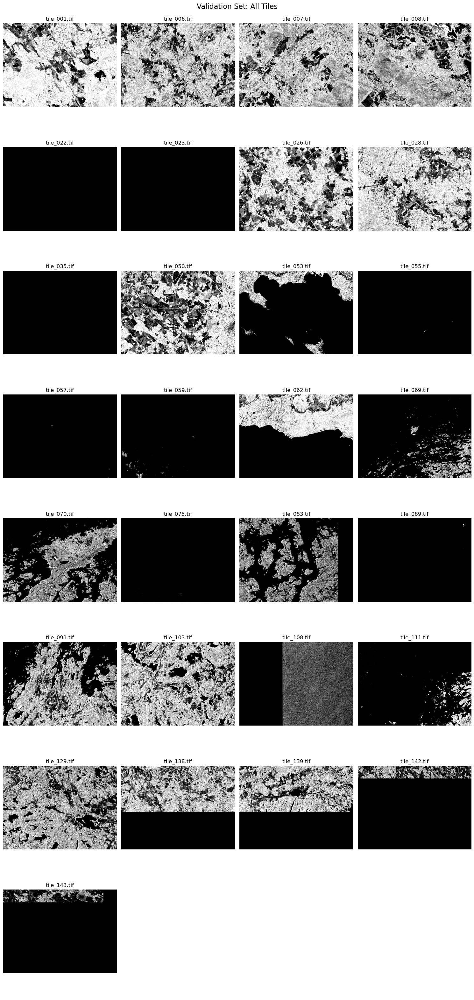

In [11]:
# Get all validation tile filenames
val_tiles = sorted([f for f in os.listdir(val_images_folder) if f.endswith(".tif")])

# Determine grid size (auto-adjust)
num_tiles = len(val_tiles)
cols = 4  # Set 4 columns
rows = (num_tiles // cols) + (num_tiles % cols > 0)  # Auto-calculate rows

# Create figure for visualization
fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))
axes = axes.flatten()

for idx, tile_file in enumerate(val_tiles):
    tile_path = os.path.join(val_images_folder, tile_file)

    with rasterio.open(tile_path) as src:
        sar_tile = src.read(1).astype(np.float32)

        # Normalize grayscale values for better contrast
        sar_tile = np.clip(sar_tile, 35, 75)  # Keep in SAR range
        sar_tile = (sar_tile - 35) / (75 - 35)  # Normalize to (0,1)

        axes[idx].imshow(sar_tile, cmap="gray", vmin=0, vmax=1)
        axes[idx].set_title(tile_file)
        axes[idx].axis("off")

# Hide any unused subplot axes
for idx in range(num_tiles, len(axes)):
    axes[idx].axis("off")

plt.suptitle("Validation Set: All Tiles", fontsize=16)
plt.tight_layout()
plt.show()


# STEP 10
### Setup YOLO ML Model

In [12]:
# Define YAML content
yaml_content = f"""path: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output
train: train/images
val: val/images
names: ["non-ship", "ship"]
nc: 2
"""

# Save data.yaml
yaml_path = "/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/data.yaml"
with open(yaml_path, "w", encoding="utf-8") as f:
    f.write(yaml_content)

print(f"data.yaml updated successfully at: {yaml_path}")

✅ data.yaml updated successfully at: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/data.yaml


# STEP 11
### Check that files are ready for training

In [13]:
# Paths
'''
base_folder = "/Users/theo/Documents/GIS Portfolio/SAR ship detection/python_ml_training"
train_images_folder = os.path.join(base_folder, "train/images")
val_images_folder = os.path.join(base_folder, "val/images")
train_labels_folder = os.path.join(base_folder, "train/labels")
val_labels_folder = os.path.join(base_folder, "val/labels")
yaml_path = os.path.join(base_folder, "data.yaml")
'''

# Count files
train_images = sorted([f for f in os.listdir(train_images_folder) if f.endswith(".tif")])
val_images = sorted([f for f in os.listdir(val_images_folder) if f.endswith(".tif")])
train_labels = sorted([f for f in os.listdir(train_labels_folder) if f.endswith(".txt")])
val_labels = sorted([f for f in os.listdir(val_labels_folder) if f.endswith(".txt")])

# Verify dataset consistency
print(f"Found {len(train_images)} train images and {len(train_labels)} train labels")
print(f"Found {len(val_images)} validation images and {len(val_labels)} validation labels")

# Ensure each image has a corresponding label file
missing_train_labels = [img.replace(".tif", ".txt") for img in train_images if img.replace(".tif", ".txt") not in train_labels]
missing_val_labels = [img.replace(".tif", ".txt") for img in val_images if img.replace(".tif", ".txt") not in val_labels]

if missing_train_labels:
    print(f"Missing {len(missing_train_labels)} train labels: {missing_train_labels}")
else:
    print("All train images have labels.")

if missing_val_labels:
    print(f"Missing {len(missing_val_labels)} validation labels: {missing_val_labels}")
else:
    print("All validation images have labels.")

# Check if data.yaml exists and looks correct
if os.path.exists(yaml_path):
    with open(yaml_path, "r", encoding="utf-8") as f:
        yaml_content = f.read()
    print("\n data.yaml found. Contents:")
    print(yaml_content)
else:
    print("\n data.yaml not found!")


✅ Found 115 train images and 115 train labels
✅ Found 29 validation images and 29 validation labels
✅ All train images have labels.
✅ All validation images have labels.

✅ data.yaml found. Contents:
path: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output
train: train/images
val: val/images
names: ["non-ship", "ship"]
nc: 2



# STEP 12
### Run training for the model

In [14]:
# Define the correct training path
data_yaml_path = f"{output_folder_path}/data.yaml"

# Load YOLOv8 model
model = YOLO("yolov8n.pt")  # Start fresh from YOLO's pre-trained model

# Train YOLO on the dataset and force weight saving
results = model.train(
    data=data_yaml_path,
    epochs=100,
    imgsz=1024,
    batch=8,
    device="mps",
    save=True,  # Ensure weights are saved
    project=f"{output_folder_path}/train",  # Explicitly save training results
    name="exp1",  # Save under a unique experiment name
    exist_ok=True  # Overwrite previous runs if needed
)

print("YOLOv8 training complete!")

New https://pypi.org/project/ultralytics/8.3.92 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.91 🚀 Python-3.13.2 torch-2.6.0 MPS (Apple M4)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output//data.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=1024, save=True, save_period=-1, cache=False, device=mps, workers=8, project=/Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output//train, name=exp1, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=Fal

train: Scanning /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/labels... 115 images, 16 backgrounds, 0 corrupt: 100%|██████████| 115/115 [00:00<00:00, 772.77it/s]

train: New cache created: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/labels.cache



val: Scanning /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/val/labels... 29 images, 3 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<00:00, 1167.62it/s]

val: New cache created: /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/val/labels.cache


Plotting labels to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/exp1/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 1024 train, 1024 val
Using 0 dataloader workers
Logging results to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/exp1
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.41G      3.518      7.103       2.34         16       1024: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]

                   all         29         82   0.000968     0.0903    0.00262   0.000862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.48G      2.814      5.071      1.931         17       1024: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]

                   all         29         82     0.0013      0.118    0.00317    0.00117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.62G      2.378      4.531      1.658         14       1024: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         29         82    0.00301      0.189     0.0178    0.00833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.64G      2.344      4.775      1.645          7       1024: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all         29         82    0.00156      0.104    0.00496    0.00192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.65G      2.275      4.317      1.662         14       1024: 100%|██████████| 15/15 [00:16<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.74s/it]

                   all         29         82    0.00294      0.308       0.04     0.0144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.69G      2.248      4.141      1.656          9       1024: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.19s/it]

                   all         29         82      0.159     0.0278      0.149     0.0678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.79G      2.181      3.751      1.607          9       1024: 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.87s/it]

                   all         29         82      0.461      0.221      0.244     0.0918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.73G      2.187      3.864       1.62         26       1024: 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.99s/it]

                   all         29         82      0.185      0.118      0.106     0.0465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.82G      2.222      3.743      1.644         33       1024: 100%|██████████| 15/15 [00:19<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.26s/it]

                   all         29         82      0.198      0.278       0.15      0.057



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.92G      2.148      3.806      1.549          6       1024: 100%|██████████| 15/15 [00:20<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.36s/it]

                   all         29         82     0.0751      0.297     0.0622      0.023



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         7G      2.142      3.666      1.597         56       1024: 100%|██████████| 15/15 [00:20<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.70s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.53s/it]

                   all         29         82      0.219      0.341      0.135     0.0738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.12G      2.125      3.534      1.585         40       1024: 100%|██████████| 15/15 [00:19<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.67s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.58s/it]

                   all         29         82      0.209      0.285      0.184     0.0902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.19G      1.996      3.358      1.518         16       1024: 100%|██████████| 15/15 [00:19<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.56s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.56s/it]

                   all         29         82      0.266      0.242      0.153     0.0799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.28G      2.064      3.315      1.552         18       1024: 100%|██████████| 15/15 [00:23<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.69s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.63s/it]

                   all         29         82      0.259      0.164      0.143     0.0916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.42G       2.12       3.14      1.581         39       1024: 100%|██████████| 15/15 [00:28<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.70s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.58s/it]

                   all         29         82       0.29      0.168      0.175     0.0861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.48G      2.018      3.032      1.585         17       1024: 100%|██████████| 15/15 [00:24<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.69s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.63s/it]

                   all         29         82      0.318      0.173      0.185     0.0846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.58G      2.013       3.08      1.528         39       1024: 100%|██████████| 15/15 [00:24<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.54s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.47s/it]

                   all         29         82      0.587      0.157      0.183     0.0884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.64G      2.044      2.988      1.552         22       1024: 100%|██████████| 15/15 [00:22<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.86s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.98s/it]

                   all         29         82      0.243      0.268      0.165     0.0497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.79G      1.974       2.96      1.497         12       1024: 100%|██████████| 15/15 [00:20<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.65s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.53s/it]

                   all         29         82      0.174      0.289       0.11     0.0415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.82G      2.009      3.122      1.584         13       1024: 100%|██████████| 15/15 [00:25<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.78s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.67s/it]

                   all         29         82      0.196      0.185      0.112     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.91G      1.957      2.998      1.519         21       1024: 100%|██████████| 15/15 [00:23<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.70s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.66s/it]

                   all         29         82      0.196      0.199      0.162     0.0788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         8G      1.898      2.869       1.45         14       1024: 100%|██████████| 15/15 [00:24<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.98s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.18s/it]

                   all         29         82       0.23      0.149       0.12     0.0612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       8.1G      1.899      2.812      1.523         14       1024: 100%|██████████| 15/15 [00:23<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.86s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.80s/it]

                   all         29         82      0.227      0.212      0.167     0.0876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      9.15G      1.975      2.815      1.507          8       1024: 100%|██████████| 15/15 [00:26<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.83s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.75s/it]

                   all         29         82      0.414      0.164      0.157     0.0858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      9.25G        1.9      2.843      1.488         29       1024: 100%|██████████| 15/15 [00:23<00:00,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.70s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.55s/it]

                   all         29         82      0.373      0.175      0.204      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      9.33G      1.866      2.633      1.515          9       1024: 100%|██████████| 15/15 [00:21<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.83s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.67s/it]

                   all         29         82       0.37      0.192      0.182     0.0727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      9.39G      1.878      2.631       1.42         28       1024: 100%|██████████| 15/15 [00:23<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.77s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.64s/it]

                   all         29         82      0.275      0.242        0.2     0.0893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      9.47G      1.866      2.493      1.463         35       1024: 100%|██████████| 15/15 [00:28<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.23s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.91s/it]

                   all         29         82      0.227      0.242       0.13     0.0586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      9.54G      1.898       2.62      1.457         13       1024: 100%|██████████| 15/15 [00:23<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.82s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.59s/it]

                   all         29         82      0.244      0.228      0.147     0.0734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      9.66G      1.848      2.456      1.427         24       1024: 100%|██████████| 15/15 [00:24<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.73s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.61s/it]

                   all         29         82      0.375      0.227       0.22     0.0904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      9.73G      1.882      2.618      1.472         13       1024: 100%|██████████| 15/15 [00:29<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.77s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.59s/it]

                   all         29         82      0.419      0.228       0.22      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      9.79G      1.926      2.483      1.553         19       1024: 100%|██████████| 15/15 [00:26<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.01s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.86s/it]

                   all         29         82      0.408      0.249      0.184     0.0893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       9.9G        1.9      2.538      1.514         27       1024: 100%|██████████| 15/15 [00:26<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.92s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.74s/it]

                   all         29         82      0.382      0.221      0.175     0.0768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      9.98G      1.821      2.451      1.497         22       1024: 100%|██████████| 15/15 [00:24<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.01s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.80s/it]

                   all         29         82      0.454      0.256      0.262      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.1G      1.887      2.346      1.488         50       1024: 100%|██████████| 15/15 [00:23<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.17s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.24s/it]

                   all         29         82       0.53      0.245      0.227      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.1G      1.861      2.383      1.482         10       1024: 100%|██████████| 15/15 [00:26<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.27s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.43s/it]

                   all         29         82      0.383      0.306      0.194     0.0798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.2G      1.827      2.333      1.476         32       1024: 100%|██████████| 15/15 [00:24<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.07s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.46s/it]

                   all         29         82      0.511      0.257      0.241      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.3G      1.787      2.355      1.414         17       1024: 100%|██████████| 15/15 [00:23<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.00s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.33s/it]

                   all         29         82      0.537       0.21      0.242     0.0973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.3G      1.862      2.354      1.476         19       1024: 100%|██████████| 15/15 [00:27<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.82s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.20s/it]

                   all         29         82      0.274      0.235      0.204      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.4G      1.782      2.386      1.418          8       1024: 100%|██████████| 15/15 [00:26<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.36s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.66s/it]

                   all         29         82      0.285      0.235      0.231       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.6G      1.754      2.325      1.461         19       1024: 100%|██████████| 15/15 [00:28<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.15s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.27s/it]

                   all         29         82      0.332      0.285      0.232      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.5G      1.766      2.307      1.389          8       1024: 100%|██████████| 15/15 [00:26<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.82s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.23s/it]

                   all         29         82      0.391      0.271      0.229      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.6G      1.771      2.252      1.425         37       1024: 100%|██████████| 15/15 [00:26<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.46s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.70s/it]

                   all         29         82      0.294      0.312       0.23       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.7G      1.798      2.241      1.465         59       1024: 100%|██████████| 15/15 [00:33<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.94s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.19s/it]

                   all         29         82      0.422      0.299      0.244      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.7G      1.722      2.239      1.428         17       1024: 100%|██████████| 15/15 [00:28<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.47s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.95s/it]

                   all         29         82      0.382      0.292      0.232       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.8G      1.764      2.259      1.435         13       1024: 100%|██████████| 15/15 [00:31<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.64s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.97s/it]

                   all         29         82      0.434      0.273      0.242      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.9G      1.776      2.201      1.439         31       1024: 100%|██████████| 15/15 [00:25<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.10s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.61s/it]

                   all         29         82      0.434      0.278       0.24      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100        11G      1.737      2.152      1.408         51       1024: 100%|██████████| 15/15 [00:26<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.08s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.55s/it]

                   all         29         82       0.36      0.242       0.22     0.0998



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      11.2G       1.73      2.132      1.365         12       1024: 100%|██████████| 15/15 [00:23<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:03<00:03,  3.98s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.23s/it]

                   all         29         82      0.342      0.306      0.216     0.0977



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.9G        1.7      2.163      1.444          5       1024: 100%|██████████| 15/15 [00:30<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.11s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.91s/it]

                   all         29         82      0.615      0.271      0.278      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      11.2G       1.75      2.084      1.351         15       1024: 100%|██████████| 15/15 [00:28<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.65s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.21s/it]

                   all         29         82      0.625      0.264      0.275      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      11.2G      1.749       2.07      1.361         26       1024: 100%|██████████| 15/15 [00:28<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.08s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.38s/it]

                   all         29         82      0.535      0.271      0.257      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      11.3G      1.805      2.115      1.394         16       1024: 100%|██████████| 15/15 [00:25<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.58s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.24s/it]

                   all         29         82      0.441      0.279      0.234      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      11.4G      1.672      2.049      1.387         20       1024: 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.40s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.56s/it]

                   all         29         82      0.329      0.292      0.211      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      11.4G      1.743      1.966      1.351         16       1024: 100%|██████████| 15/15 [00:27<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.14s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.32s/it]

                   all         29         82      0.351      0.235      0.213      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      11.5G      1.654      1.989      1.366          5       1024: 100%|██████████| 15/15 [00:25<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.23s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.35s/it]

                   all         29         82      0.406      0.299      0.232      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      11.5G      1.694      2.044      1.379         26       1024: 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.29s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.94s/it]

                   all         29         82       0.54      0.289      0.246       0.09



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      11.7G      1.681      1.928      1.374         11       1024: 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.28s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.08s/it]

                   all         29         82      0.431      0.312      0.224      0.091



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      11.7G      1.682      1.985      1.389         21       1024: 100%|██████████| 15/15 [00:25<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.29s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.68s/it]

                   all         29         82       0.45      0.278      0.254     0.0897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      11.9G      1.667      2.035      1.407         10       1024: 100%|██████████| 15/15 [00:30<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.46s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.53s/it]

                   all         29         82      0.574      0.274      0.273      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      11.9G      1.665      1.907      1.379         10       1024: 100%|██████████| 15/15 [00:29<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:08<00:08,  8.25s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.72s/it]

                   all         29         82      0.353      0.242      0.238     0.0996



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100        12G      1.598      1.779      1.316         22       1024: 100%|██████████| 15/15 [00:24<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.70s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.50s/it]

                   all         29         82      0.302      0.266      0.223     0.0959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      12.1G      1.665       1.87      1.414          8       1024: 100%|██████████| 15/15 [00:23<00:00,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.29s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.04s/it]

                   all         29         82      0.321      0.249      0.242      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      12.2G      1.566      1.775      1.285         20       1024: 100%|██████████| 15/15 [00:25<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.90s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.56s/it]

                   all         29         82      0.483      0.221      0.235       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      12.2G      1.622      1.761      1.341         21       1024: 100%|██████████| 15/15 [00:33<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.48s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.27s/it]

                   all         29         82      0.386      0.286      0.255     0.0903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      12.3G      1.574      1.803      1.319         18       1024: 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.72s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.72s/it]

                   all         29         82      0.268      0.249      0.174     0.0484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      12.4G      1.576      1.692      1.302         14       1024: 100%|██████████| 15/15 [00:26<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.89s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.88s/it]

                   all         29         82      0.654      0.224      0.256     0.0858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.5G      1.579      1.879      1.369         11       1024: 100%|██████████| 15/15 [00:26<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.80s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.22s/it]

                   all         29         82      0.318      0.299      0.255      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      12.5G      1.622      1.847      1.309         29       1024: 100%|██████████| 15/15 [00:26<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.88s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.96s/it]

                   all         29         82      0.344      0.313      0.254      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      12.6G      1.648      1.804      1.314         28       1024: 100%|██████████| 15/15 [00:31<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.26s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.13s/it]

                   all         29         82       0.45      0.238      0.256      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      12.7G      1.528      1.718      1.284         13       1024: 100%|██████████| 15/15 [00:30<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.61s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.03s/it]


                   all         29         82      0.479      0.221      0.246     0.0747

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.8G      1.577      1.721      1.294         27       1024: 100%|██████████| 15/15 [00:28<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.14s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.86s/it]

                   all         29         82      0.382      0.235      0.208     0.0487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      12.8G      1.584      1.808      1.318          7       1024: 100%|██████████| 15/15 [00:30<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:08<00:08,  8.72s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.61s/it]

                   all         29         82      0.413      0.228      0.208     0.0614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      12.9G      1.512      1.646      1.237         15       1024: 100%|██████████| 15/15 [00:30<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.12s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.89s/it]

                   all         29         82      0.507      0.221       0.22      0.098



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100        13G      1.495      1.708      1.268          8       1024: 100%|██████████| 15/15 [00:27<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.80s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.29s/it]

                   all         29         82      0.408      0.228      0.223     0.0635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      13.1G      1.519      1.601      1.259         44       1024: 100%|██████████| 15/15 [00:24<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.32s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.22s/it]

                   all         29         82      0.368      0.196      0.157     0.0638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      13.1G      1.536       1.65      1.268         10       1024: 100%|██████████| 15/15 [00:27<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.57s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.22s/it]

                   all         29         82      0.404      0.192      0.159     0.0755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      13.2G      1.464      1.685      1.317         10       1024: 100%|██████████| 15/15 [00:27<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:08<00:08,  8.42s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.65s/it]

                   all         29         82       0.39      0.199      0.169     0.0671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      13.2G       1.53      1.608      1.287         11       1024: 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.68s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.82s/it]

                   all         29         82      0.365      0.265      0.211     0.0853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      13.3G      1.519      1.637      1.309         15       1024: 100%|██████████| 15/15 [00:28<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.06s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.22s/it]

                   all         29         82      0.509      0.228      0.219      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      13.4G      1.516      1.588      1.257         12       1024: 100%|██████████| 15/15 [00:31<00:00,  2.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.60s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.50s/it]

                   all         29         82      0.619      0.227      0.248      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      13.5G      1.469      1.634      1.236          4       1024: 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:04<00:04,  4.91s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.97s/it]

                   all         29         82      0.355      0.249      0.232      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      13.6G      1.445      1.555      1.197          6       1024: 100%|██████████| 15/15 [00:29<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:08<00:08,  8.21s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.54s/it]

                   all         29         82      0.511      0.207      0.226      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      13.7G      1.426      1.505      1.224          6       1024: 100%|██████████| 15/15 [00:28<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.22s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.21s/it]


                   all         29         82      0.704      0.213      0.238      0.136

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      13.8G      1.453      1.578       1.21         10       1024: 100%|██████████| 15/15 [00:25<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:08<00:08,  8.07s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:18<00:00,  9.05s/it]

                   all         29         82      0.609      0.221      0.244     0.0973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      13.9G      1.484      1.595      1.257         10       1024: 100%|██████████| 15/15 [00:30<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.51s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.10s/it]

                   all         29         82      0.492      0.171       0.19     0.0857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      13.9G      1.464       1.56      1.213         10       1024: 100%|██████████| 15/15 [00:30<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.72s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.51s/it]


                   all         29         82      0.514      0.228      0.253       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100        14G      1.472      1.507      1.218         17       1024: 100%|██████████| 15/15 [00:29<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.69s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.82s/it]

                   all         29         82      0.637      0.235      0.269      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100        14G       1.38       1.44      1.217         29       1024: 100%|██████████| 15/15 [00:27<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.78s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.63s/it]

                   all         29         82      0.594      0.235      0.264       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      14.1G      1.444      1.515       1.23         20       1024: 100%|██████████| 15/15 [00:26<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.55s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.93s/it]


                   all         29         82      0.405      0.356      0.337      0.147
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      14.2G      1.288      2.174      1.089          0       1024: 100%|██████████| 15/15 [00:34<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.13s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.63s/it]


                   all         29         82      0.641      0.263      0.285      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      14.3G      1.408      1.574      1.212         14       1024: 100%|██████████| 15/15 [00:30<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.60s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.27s/it]

                   all         29         82      0.564      0.235      0.258     0.0955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      14.4G      1.451      1.595      1.195         14       1024: 100%|██████████| 15/15 [00:28<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.34s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.53s/it]

                   all         29         82      0.557      0.228      0.253      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      14.5G      1.385      1.497      1.168         11       1024: 100%|██████████| 15/15 [00:31<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.66s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.19s/it]


                   all         29         82      0.552      0.228      0.252      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      14.5G      1.344      1.474      1.169          9       1024: 100%|██████████| 15/15 [00:33<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.74s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.80s/it]


                   all         29         82       0.42      0.299      0.288      0.136

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      14.6G      1.346      1.494      1.175         14       1024: 100%|██████████| 15/15 [00:27<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.83s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.64s/it]


                   all         29         82      0.592      0.237      0.256      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      14.6G      1.317      1.531      1.159          1       1024: 100%|██████████| 15/15 [00:35<00:00,  2.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.29s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.12s/it]


                   all         29         82      0.428      0.299      0.289      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      14.8G      1.333      1.529      1.171         10       1024: 100%|██████████| 15/15 [00:27<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.28s/it]


                   all         29         82      0.456      0.369      0.349      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      14.9G      1.366      1.545      1.218          5       1024: 100%|██████████| 15/15 [00:31<00:00,  2.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.67s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.51s/it]

                   all         29         82      0.603      0.228      0.249      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      14.8G      1.372      1.579       1.19          8       1024: 100%|██████████| 15/15 [00:36<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.28s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.85s/it]


                   all         29         82      0.642      0.249      0.266      0.135

100 epochs completed in 1.030 hours.
Optimizer stripped from /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/exp1/weights/last.pt, 6.3MB
Optimizer stripped from /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/exp1/weights/best.pt, 6.3MB

Validating /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/exp1/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.13.2 torch-2.6.0 MPS (Apple M4)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:15<00:15, 15.98s/it]

WARNING ⚠️ NMS time limit 2.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:32<00:00, 16.03s/it]


                   all         29         82      0.438      0.319      0.303      0.153
              non-ship         23         72      0.177      0.139     0.0914     0.0402
                  ship          5         10      0.699        0.5      0.514      0.265
Speed: 8.3ms preprocess, 182.8ms inference, 0.0ms loss, 201.1ms postprocess per image
Results saved to /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/exp1
✅ YOLOv8 training complete!


# STEP 13

🟢 Running YOLO on tile_078.tif...

image 1/1 /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_078.tif: 480x640 2 ships, 16.9ms
Speed: 1.7ms preprocess, 16.9ms inference, 4.5ms postprocess per image at shape (1, 3, 480, 640)


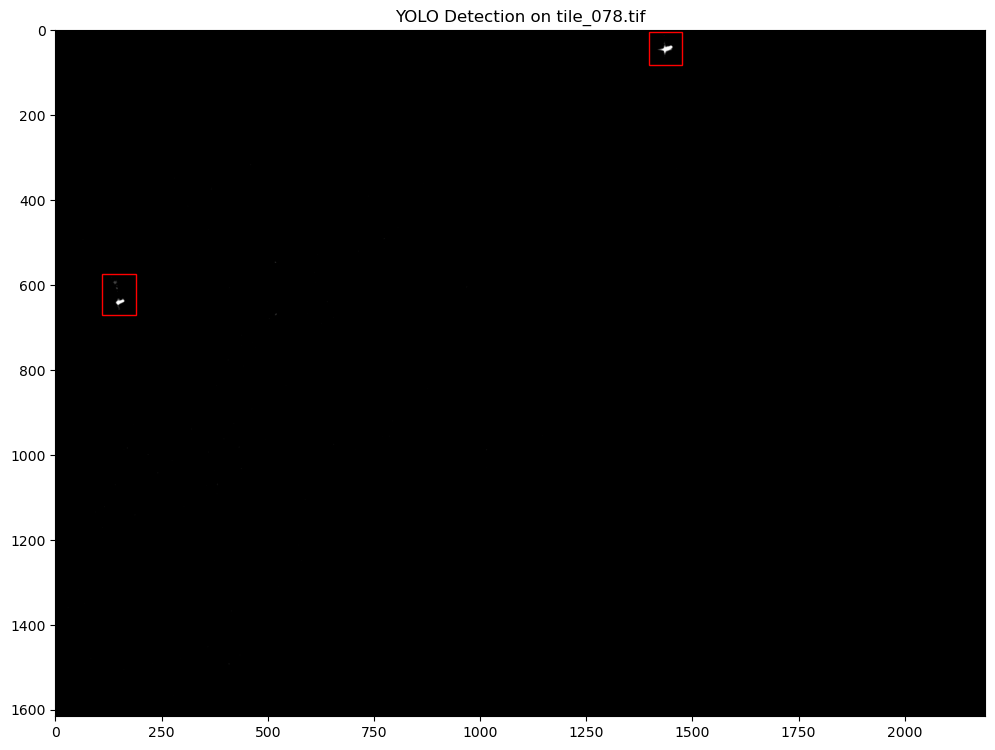

🟢 Running YOLO on tile_076.tif...

image 1/1 /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_076.tif: 480x640 3 ships, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 4.5ms postprocess per image at shape (1, 3, 480, 640)


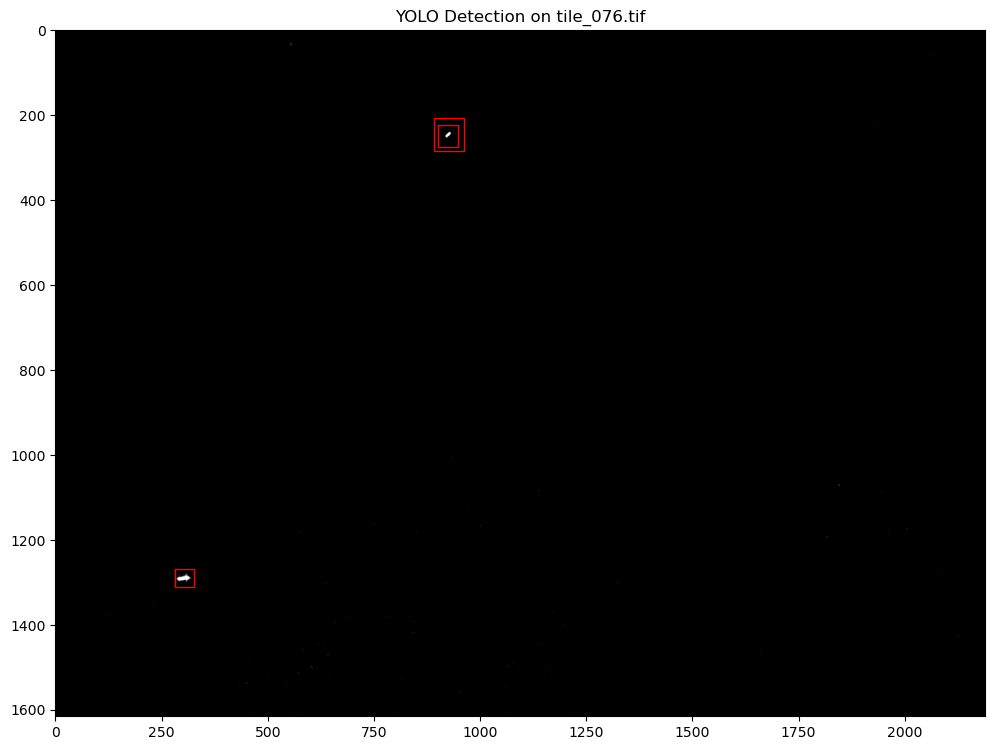

🟢 Running YOLO on tile_074.tif...

image 1/1 /Users/theo/Documents/GIS_portfolio/SAR_ship_detection/python_ml_training/output/train/images/tile_074.tif: 480x640 (no detections), 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


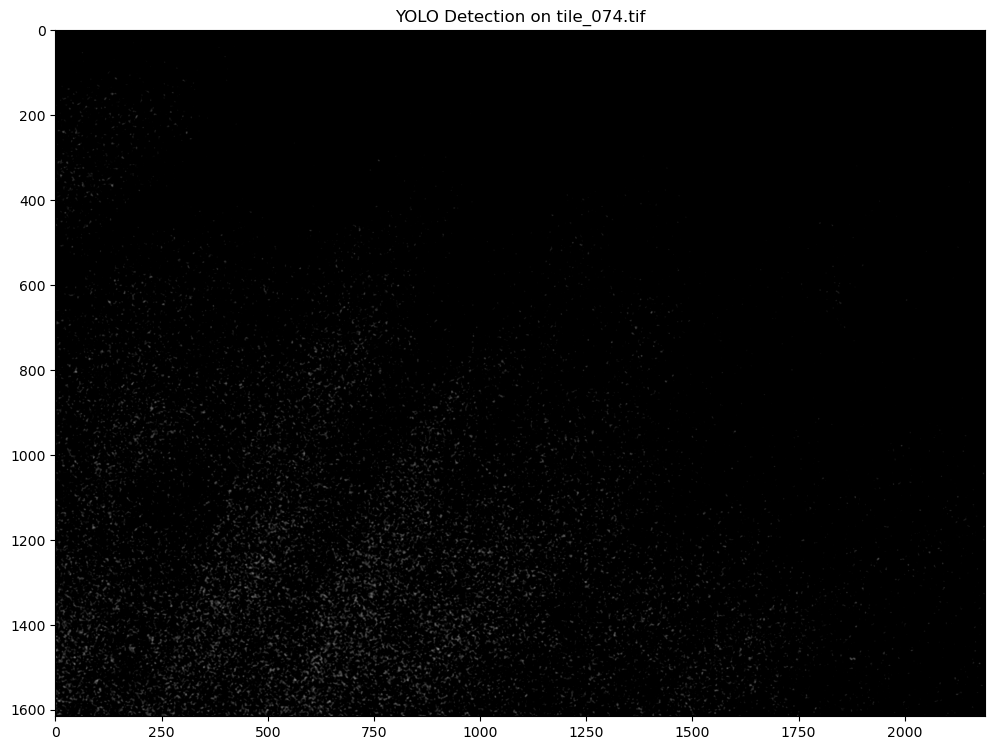

In [40]:
# Paths
val_images_path = os.path.join(output_folder_path, "train/images")
weights_path = os.path.join(output_folder_path, "train/exp1/weights/best.pt")  # Use best.pt

# If best.pt doesn't exist, use last.pt
if not os.path.exists(weights_path):
    weights_path = os.path.join(output_folder_path, "train/exp1/weights/last.pt")
    print(" best.pt not found, using last.pt instead")

# Load YOLO model
model = YOLO(weights_path)

# List of tiles to run inference on
tiles_to_test = ["tile_078.tif", "tile_076.tif", "tile_074.tif"]  # Add more if needed

# Run YOLO on each tile
for tile_name in tiles_to_test:
    tile_path = os.path.join(val_images_path, tile_name)
    
    if not os.path.exists(tile_path):
        print(f" Skipping {tile_name}, file not found.")
        continue

    print(f" Running YOLO on {tile_name}...")

    # Convert tile to 8-bit (if needed)
    with rasterio.open(tile_path) as src:
        tile = src.read(1).astype(np.float32)

        # Normalize contrast (35-75) to 8-bit range
        tile = np.clip(tile, 35, 75)
        tile = ((tile - 35) / (75 - 35) * 255).astype(np.uint8)

    # Run YOLO inference (Lower confidence threshold to detect more ships)
    results = model.predict(tile_path, imgsz=640, conf=0.3, iou=0.5, device="mps")

    # Visualize detections
    fig, ax = plt.subplots(figsize=(12, 12))
    plt.imshow(tile, cmap="gray", vmin=0, vmax=255)

    # Overlay bounding boxes
    for r in results:
        for box in r.boxes.xyxy.cpu().numpy():
            x1, y1, x2, y2 = box
            ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="red", linewidth=1))

    plt.title(f"YOLO Detection on {tile_name}")
    plt.show()
